In [1]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install prophet

Note: you may need to restart the kernel to use updated packages.


In [29]:
import pandas as pd           # Veri çerçeveleri oluşturmak ve veri setlerini okumak için idealdir.
import numpy as np            # Sayısal işlemler için.
import matplotlib.pyplot as plt # Görselleştirme için grafik ve çizimler.
from sklearn.cluster import KMeans # Kümeleme algoritması olarak KMeans kullanılır. Verileri belirli sayıda kümeye ayırmak için.
from sklearn.preprocessing import StandardScaler # Verilerin ölçeklendirilmesi için kullanılır.
from sklearn.model_selection import train_test_split # Veri setini eğitim ve test olarak ayırmak için.
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
 

import warnings
warnings.filterwarnings('ignore')

In [31]:
df = pd.read_csv('data.csv', encoding='windows-1252') #dosya farklı bir kodlamada oldugu için encoding kullanmamız gerekiyor.

In [33]:
df.head()#ilk 5 satırı ve sütün bilgileri verir

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [35]:
df.tail() # son 5 satır ve sütün bilgileri verir

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France
541908,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,12/9/2011 12:50,4.95,12680.0,France


In [37]:
df.info()#genel bilgileri verir int object türler Non-Null Count: Sütunda kaç tane boş değer olmadığı bilgisi

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [39]:
# Data türlerini optimize etme
df['InvoiceNo'] = df['InvoiceNo'].astype('category')  # Fatura numarası kategorik olarak saklanır
df['StockCode'] = df['StockCode'].astype('category')  # Stok kodları kategorik yapılır
df['Description'] = df['Description'].astype('category')  # Ürün açıklamaları kategorik yapılır
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])  # Fatura tarihi datetime formatına dönüştürülür
df['Country'] = df['Country'].astype('category')  # Ülkeler kategorik yapılır




In [41]:
df.info() # Bellek kullanımının önemli ölçüde azaldığını ve analizlerin hızlandığını görebiliriz.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  category      
 1   StockCode    541909 non-null  category      
 2   Description  540455 non-null  category      
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  category      
dtypes: category(4), datetime64[ns](1), float64(2), int64(1)
memory usage: 21.7 MB


In [227]:
df.shape

(372184, 15)

In [43]:
df.isnull().sum() #kaç tane eksik veri var toplamı

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [45]:
# Eksik değer sayısını hesaplayın
missing_values = df.isnull().sum()

# Toplam değer sayısını hesaplama
total_values = df.shape[0]

# Eksik değer oranını hesaplama
missing_percentage = (missing_values / total_values) * 100

# Sonuçları birleştirmek
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Missing Percentage': missing_percentage})

# Eksik değerlerin oranlarını görüntüleyin
print(missing_data)

             Missing Values  Missing Percentage
InvoiceNo                 0            0.000000
StockCode                 0            0.000000
Description            1454            0.268311
Quantity                  0            0.000000
InvoiceDate               0            0.000000
UnitPrice                 0            0.000000
CustomerID           135080           24.926694
Country                   0            0.000000


In [49]:
# Negatif miktarları ve birim fiyatları çıkar
df = df[(df['Quantity'] > 0) & (df['UnitPrice'] > 0)]


In [51]:
df.dropna(subset=['CustomerID'], inplace=True)
#customer ıd oldukça yüksek deger var eksiklik oranı silinmesi gerekir dogru analiz için %24.93

In [53]:
df.isnull().sum() #Tekrar eksik verilerin toplamını kontrol eder.

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [55]:
df.describe().T #sayısal sütunlar hakkında hızlıca bilgi almak ve bu bilgileri daha okunabilir bir formatta sunmak için oldukça kullanışlıdır

,count,mean,min,25%,50%,75%,max,std
Quantity,397884.0,12.988238,1.0,2.0,6.0,12.0,80995.0,179.331775
InvoiceDate,397884,2011-07-10 23:41:23.511023360,2010-12-01 08:26:00,2011-04-07 11:12:00,2011-07-31 14:39:00,2011-10-20 14:33:00,2011-12-09 12:50:00,NaN
UnitPrice,397884.0,3.116488,0.001,1.25,1.95,3.75,8142.75,22.097877
CustomerID,397884.0,15294.423453,12346.0,13969.0,15159.0,16795.0,18287.0,1713.14156


In [57]:
Q1 = df['Quantity'].quantile(0.25)
Q3 = df['Quantity'].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR
df = df[(df['Quantity'] >= lower_limit) & (df['Quantity'] <= upper_limit)]


In [59]:
df = df[df['UnitPrice'] > 0.01] 

In [61]:
df[df['UnitPrice'] < 0.1]['Description'].value_counts()

Description
BLUE STONES ON WIRE FOR CANDLE         16
LETTER SHAPE PENCIL SHARPENER          13
CARTOON  PENCIL SHARPENERS             11
HOUSE SHAPE PENCIL SHARPENER            7
PIECE OF CAMO STATIONERY SET            6
                                       ..
FRENCH STYLE EMBOSSED HEART CABINET     0
FRENCH STYLE STORAGE JAR BONBONS        0
FRENCH STYLE STORAGE JAR CAFE           0
FRENCH STYLE STORAGE JAR JAM            0
wrongly sold sets                       0
Name: count, Length: 4223, dtype: int64

In [63]:
df[df['UnitPrice'] > 1000][['Description', 'UnitPrice']]

,Description,UnitPrice
117054,Manual,1687.17
117055,Manual,1687.17
144826,Manual,2382.92
144828,Manual,1252.95
144829,Manual,2053.07
145831,Manual,1136.30
150615,Manual,1867.86
173382,POSTAGE,8142.75
200745,Manual,1241.98
201553,Manual,1241.98


In [65]:
manual_rows = df[df['Description'].str.contains('Manual', case=False)]
print(manual_rows[['Description', 'UnitPrice']].head(10))


      Description  UnitPrice
2239       Manual       1.25
2250       Manual      18.95
6798       Manual       0.85
7976       Manual       0.42
8587       Manual       0.42
8588       Manual       0.85
9326       Manual       0.65
9575       Manual       0.85
10113      Manual       1.00
12423      Manual       0.19


In [67]:
postage_rows = df[df['Description'].str.contains('POSTAGE', case=False)] #postage kayıtlarını çıkarır , çünkü kargo ücretleri satış analizine katkı sağlamaz.
print(postage_rows[['Description', 'UnitPrice']].head(10))

     Description  UnitPrice
45       POSTAGE       18.0
386      POSTAGE       15.0
1123     POSTAGE       18.0
5073     POSTAGE       18.0
5258     POSTAGE       18.0
5325     POSTAGE       40.0
5369     POSTAGE       18.0
6602     POSTAGE       18.0
6676     POSTAGE       18.0
6973     POSTAGE       18.0


In [69]:
df = df[~((df['Description'].str.contains('Manual', case=False)) & (df['UnitPrice'] > 100))]
#yüksek fiyatlı olanları çıkaralım  Yüksek fiyatlı "Manual" kayıtları (örneğin 1687.17) çıkarılmalı.
# Düşük fiyatlı "Manual" ürünleri kılavuz olabilir, bu nedenle onları tutmak daha iyi bir tercih olabilir.

In [75]:
 

# 1️⃣ UnitPrice sütunu için IQR (Interquartile Range) hesapla
Q1 = df['UnitPrice'].quantile(0.25)
Q3 = df['UnitPrice'].quantile(0.75)
IQR = Q3 - Q1

# Aykırı değer sınırlarını hesapla
lower_bound = Q1 - 1.5 * IQR  # Alt sınır
upper_bound = Q3 + 1.5 * IQR  # Üst sınır

print(f"Alt sınır: {lower_bound}, Üst sınır: {upper_bound}")

# 2️⃣ Aykırı değerleri bul ve filtrele
df_cleaned = df[(df['UnitPrice'] >= lower_bound) & (df['UnitPrice'] <= upper_bound)]

# 3️⃣ Karşılaştırma için orijinal ve temizlenmiş veri setlerinin özet istatistikleri
print("Önceki veri kümesi boyutu:", df.shape)
print("Temizlenmiş veri kümesi boyutu:", df_cleaned.shape)

# 4️⃣ Son istatistiklerin kontrolü
print(df_cleaned['UnitPrice'].describe())


Alt sınır: -2.5, Üst sınır: 7.5
Önceki veri kümesi boyutu: (372184, 8)
Temizlenmiş veri kümesi boyutu: (338147, 8)
count    338147.000000
mean          2.192043
std           1.544761
min           0.060000
25%           1.250000
50%           1.650000
75%           2.950000
max           7.500000
Name: UnitPrice, dtype: float64


In [79]:
df_cleaned = df_cleaned[(df_cleaned['UnitPrice'] >= 0.1) & (df_cleaned['UnitPrice'] <= 1000)]

In [83]:
# UnitPrice aralığını belirle (0.1 ile 1000 arasında olan değerleri al)
df_cleaned = df[(df['UnitPrice'] >= 0.1) & (df['UnitPrice'] <= 1000)]

# Yeni veri kümesinin özetini kontrol et
print("Önceki veri kümesi boyutu:", df.shape)
print("Temizlenmiş veri kümesi boyutu:", df_cleaned.shape)

# Yeni istatistikleri gör
print(df_cleaned['UnitPrice'].describe())
# std	5.99	Standart sapma önceki 15.40 değerine göre çok daha düşük, bu da veri kalitesinin arttığını gösterir
# max	908.16	Üst sınır artık 8142.75 değil. Temizleme işlemi başarılı

#  Başarılar
# Aykırı değerleri etkili bir şekilde temizlediniz. Artık yalnızca 0.1 - 908.16 TL aralığında fiyatlar var.
# Standart sapma (std) düştü (15.40 → 5.99), bu da veri kalitesinin arttığını gösterir.
# max (maximum) = 908.16: Bu, daha önce 8142.75 idi. Bu değişiklik, aşırı yüksek değerlerin etkisini ortadan kaldırdı.

Önceki veri kümesi boyutu: (372184, 8)
Temizlenmiş veri kümesi boyutu: (372119, 8)
count    372119.000000
mean          3.060615
std           5.993654
min           0.100000
25%           1.250000
50%           1.950000
75%           3.750000
max         908.160000
Name: UnitPrice, dtype: float64


In [87]:
df_cleaned = df_cleaned[df_cleaned['UnitPrice'] >= 0.50]

# 0.50 TL'den daha düşük fiyatları temizlememiz daha iyi sonuçlar verir analiz için 

In [89]:
# UnitPrice = 0.06 olanları temizle
df_cleaned = df_cleaned[df_cleaned['UnitPrice'] > 0.06]

In [91]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Quantity,372184.0,7.030837,1.0,2.0,4.0,12.0,27.0,6.66165
InvoiceDate,372184,2011-07-11 07:22:39.587193344,2010-12-01 08:26:00,2011-04-07 11:30:00,2011-08-01 10:09:00,2011-10-21 12:12:00,2011-12-09 12:50:00,NaN
UnitPrice,372184.0,3.097813,0.06,1.25,1.95,3.75,8142.75,15.406304
CustomerID,372184.0,15309.723862,12347.0,13985.0,15194.0,16813.0,18287.0,1711.50822


In [93]:


#  POSTAGE, MANUAL, DOTCOM POSTAGE ürünlerini temizleyelim
df_cleaned = df_cleaned[~df_cleaned['Description'].str.contains('POSTAGE|DOTCOM POSTAGE|Manual', case=False, na=False)]

# UnitPrice 0.50'den küçükse temizleyelim
df_cleaned = df_cleaned[df_cleaned['UnitPrice'] >= 0.50]

#  Özel olarak 0.06 UnitPrice değerlerini kontrol edelim ve temizleyelim
df_cleaned = df_cleaned[df_cleaned['UnitPrice'] > 0.06]

#  Sonuçları kontrol edelim
print(df_cleaned['UnitPrice'].describe())


count    338484.000000
mean          3.229289
std           4.465991
min           0.500000
25%           1.250000
50%           2.080000
75%           3.750000
max         649.500000
Name: UnitPrice, dtype: float64


In [95]:
 

#  UnitPrice temizliği
# Alt sınır 0.50, Üst sınır 7.5
df_cleaned = df_cleaned[(df_cleaned['UnitPrice'] >= 0.50) & (df_cleaned['UnitPrice'] <= 7.5)]

#  Quantity temizliği
# Sadece Quantity > 0 olan kayıtları al
df_cleaned = df_cleaned[df_cleaned['Quantity'] > 0]

#  Sonuçları kontrol et
print(df_cleaned[['Quantity', 'UnitPrice', 'CustomerID']].describe())

            Quantity      UnitPrice     CustomerID
count  305585.000000  305585.000000  305585.000000
mean        6.821117       2.384259   15326.959393
std         6.106721       1.501437    1710.795850
min         1.000000       0.500000   12347.000000
25%         2.000000       1.250000   13999.000000
50%         5.000000       1.950000   15241.000000
75%        12.000000       2.950000   16825.000000
max        27.000000       7.500000   18287.000000


In [99]:
# UnitPrice > 0.5 filtrelemesi
df_cleaned = df_cleaned[df_cleaned['UnitPrice'] > 0.5]


In [101]:
# En yüksek fiyatlara sahip ilk 10 satırı görüntüle
df_high_prices = df_cleaned[df_cleaned['UnitPrice'] > df_cleaned['UnitPrice'].quantile(0.99)]
print(df_high_prices[['Description', 'UnitPrice']].sort_values(by='UnitPrice', ascending=False).head(10))


                         Description  UnitPrice
205324  PARISIENNE JEWELLERY DRAWER         7.5
422026      PARISIENNE CURIO CABINET        7.5
394854  PARISIENNE JEWELLERY DRAWER         7.5
394698  PARISIENNE JEWELLERY DRAWER         7.5
228641      PARISIENNE CURIO CABINET        7.5
228743  PARISIENNE JEWELLERY DRAWER         7.5
393572      PARISIENNE CURIO CABINET        7.5
229482  PARISIENNE JEWELLERY DRAWER         7.5
230328      PARISIENNE CURIO CABINET        7.5
231504         WHITE WIRE EGG HOLDER        7.5


In [103]:
# Temizleme sonrası veri istatistikleri
df_cleaned.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,305547.000000,305547,305547.000000,305547.000000
mean,6.820584,2011-07-10 23:40:27.465365248,2.384493,15326.928813
min,1.000000,2010-12-01 08:26:00,0.530000,12347.000000
25%,2.000000,2011-04-06 10:27:00,1.250000,13999.000000
50%,5.000000,2011-08-01 13:54:00,1.950000,15241.000000
75%,12.000000,2011-10-21 12:56:00,2.950000,16825.000000
max,27.000000,2011-12-09 12:50:00,7.500000,18287.000000
std,6.106280,NaN,1.501383,1710.767773


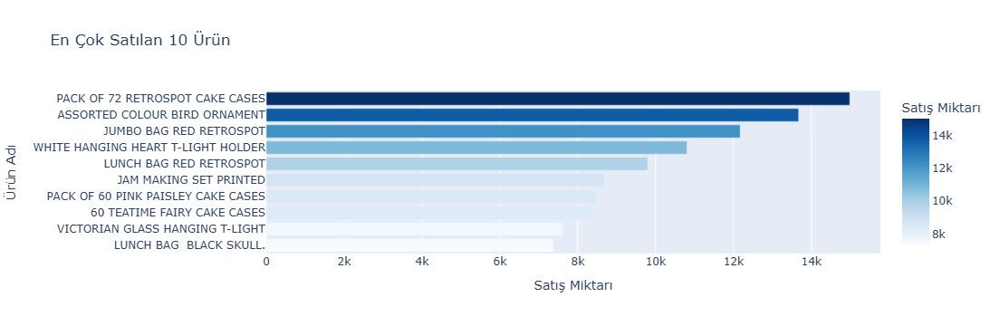

In [105]:
# En çok satılan 10 ürünü bul
most_sold_products = (df_cleaned.groupby('Description')['Quantity']
                      .sum()
                      .sort_values(ascending=False)
                      .head(10)
                      .reset_index())

# Plotly bar plot oluştur
fig = px.bar(most_sold_products, 
             x='Quantity', 
             y='Description', 
             orientation='h',  # Yatay çubuk grafiği için
             title='En Çok Satılan 10 Ürün', 
             labels={'Quantity': 'Satış Miktarı', 'Description': 'Ürün Adı'}, 
             color='Quantity', 
             color_continuous_scale='Blues')

# Grafik düzenlemeleri
fig.update_layout(yaxis={'categoryorder':'total ascending'}, 
                  xaxis_title='Satış Miktarı', 
                  yaxis_title='Ürün Adı')

# Grafiği göster
fig.show()

 

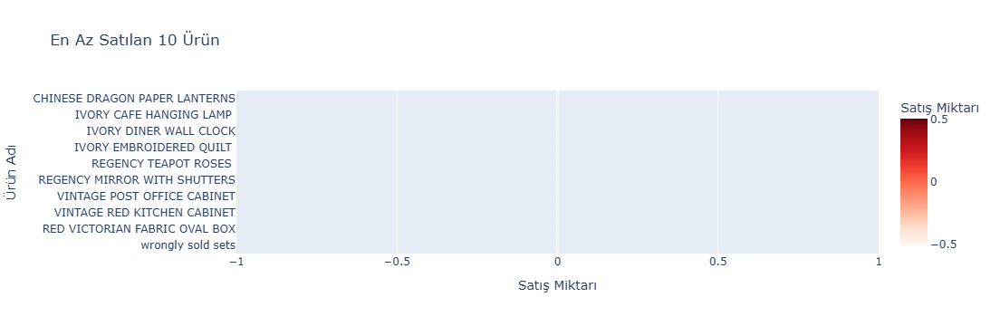

In [107]:
#  Ürün bazında satış miktarlarını hesapla
least_sold_products = df_cleaned.groupby('Description')['Quantity'].sum().sort_values(ascending=True).head(10)

#  DataFrame'e dönüştür
least_sold_df = least_sold_products.reset_index()

# . Plotly ile çubuk grafiği oluştur
fig = px.bar(
    least_sold_df, 
    x='Quantity', 
    y='Description', 
    orientation='h',  # Yatay çubuk grafik
    title='En Az Satılan 10 Ürün', 
    labels={'Quantity': 'Satış Miktarı', 'Description': 'Ürün Adı'},
    color='Quantity',  # Renk miktara göre belirlensin
    color_continuous_scale='Reds'  # Kırmızı tonlarında renk skalası
)

# 4. Grafik göster
fig.show()



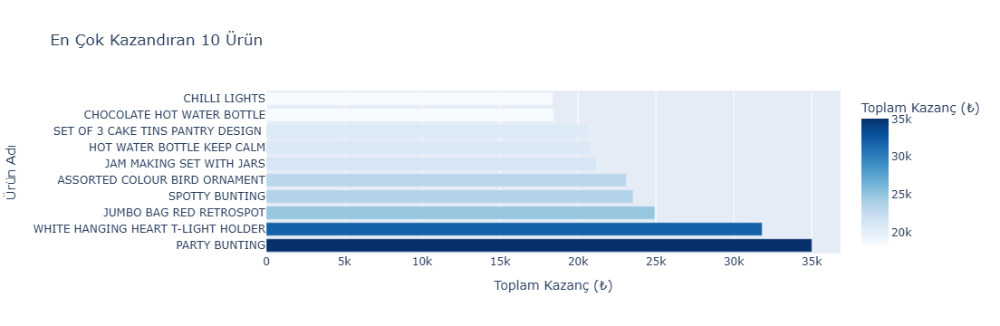

In [109]:
# 1. Toplam kazanç sütunu ekle (Quantity * UnitPrice)
df_cleaned['TotalRevenue'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']

# 2. Ürün bazında toplam kazançları hesapla
most_profitable_products = df_cleaned.groupby('Description')['TotalRevenue'].sum().sort_values(ascending=False).head(10)

# 3. DataFrame'e dönüştür
most_profitable_df = most_profitable_products.reset_index()

# 4. Plotly ile çubuk grafiği oluştur
fig = px.bar(
    most_profitable_df, 
    x='TotalRevenue', 
    y='Description', 
    orientation='h',  # Yatay çubuk grafik
    title='En Çok Kazandıran 10 Ürün', 
    labels={'TotalRevenue': 'Toplam Kazanç (₺)', 'Description': 'Ürün Adı'},
    color='TotalRevenue',  # Renk toplam kazanca göre belirlensin
    color_continuous_scale='Blues'  # Mavi tonlarında renk skalası
)

# 5. Grafik göster
fig.show()


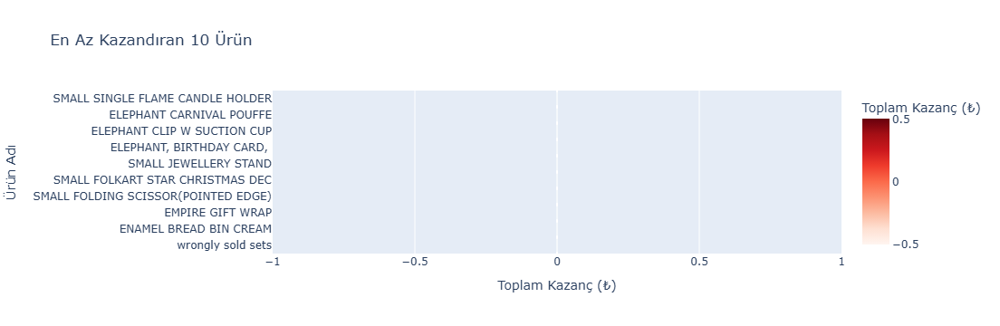

In [111]:

# 1. Toplam kazanç sütunu ekle (Quantity * UnitPrice) (Daha önce eklemediyseniz ekleyin)
df_cleaned['TotalRevenue'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']

# 2. Ürün bazında toplam kazançları hesapla
least_profitable_products = df_cleaned.groupby('Description')['TotalRevenue'].sum().sort_values(ascending=True).head(10)

# 3. DataFrame'e dönüştür
least_profitable_df = least_profitable_products.reset_index()

# 4. Plotly ile çubuk grafiği oluştur
fig = px.bar(
    least_profitable_df, 
    x='TotalRevenue', 
    y='Description', 
    orientation='h',  # Yatay çubuk grafik
    title='En Az Kazandıran 10 Ürün', 
    labels={'TotalRevenue': 'Toplam Kazanç (₺)', 'Description': 'Ürün Adı'},
    color='TotalRevenue',  # Renk toplam kazanca göre belirlensin
    color_continuous_scale='Reds'  # Kırmızı tonlarında renk skalası
)

# 5. Grafik göster
fig.show()

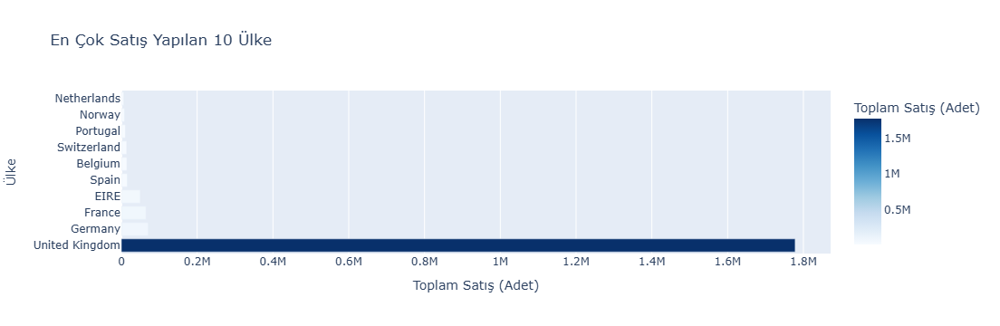

In [113]:
#   Ülke bazında toplam satış miktarını (Quantity) hesaplar
top_countries = df_cleaned.groupby('Country')['Quantity'].sum().sort_values(ascending=False).head(10)

#    DataFrame'e dönüştür
top_countries_df = top_countries.reset_index()

#   Plotly ile çubuk grafiği oluştururuz
fig = px.bar(
    top_countries_df, 
    x='Quantity', 
    y='Country', 
    orientation='h',  # Yatay çubuk grafik
    title='En Çok Satış Yapılan 10 Ülke', 
    labels={'Quantity': 'Toplam Satış (Adet)', 'Country': 'Ülke'}, 
    color='Quantity',  # Renk toplam satışa göre belirlensin
    color_continuous_scale='Blues'  # Mavi tonlarında renk skalası
)

#  Grafiği gösterir
fig.show()


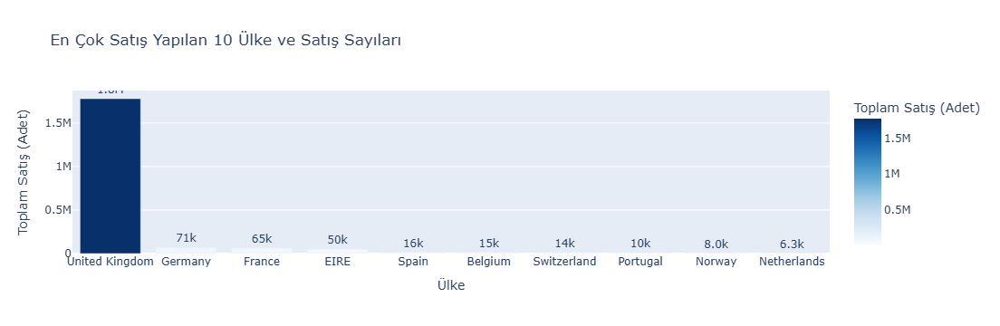

In [115]:
# 1. Ülke bazında toplam satış miktarını (Quantity) hesapla
top_countries = df_cleaned.groupby('Country')['Quantity'].sum().sort_values(ascending=False).head(10)

# 2. DataFrame'e dönüştür
top_countries_df = top_countries.reset_index()

# 3. Plotly ile çubuk grafiği oluştur
fig = px.bar(
    top_countries_df, 
    x='Country', 
    y='Quantity', 
    title='En Çok Satış Yapılan 10 Ülke ve Satış Sayıları', 
    labels={'Quantity': 'Toplam Satış (Adet)', 'Country': 'Ülke'}, 
    color='Quantity',  # Renk toplam satışa göre belirlensin
    color_continuous_scale='Blues',  # Mavi tonlarında renk skalası
    text='Quantity'  # Çubukların üzerinde toplam satış miktarını göster
)

# 4. Grafik düzenlemeleri
fig.update_traces(
    texttemplate='%{text:.2s}',  # Satış sayılarını kısalt (örn. 1.2K)
    textposition='outside'  # Metni çubukların üstüne koy
)

# 5. Grafik göster
fig.show()


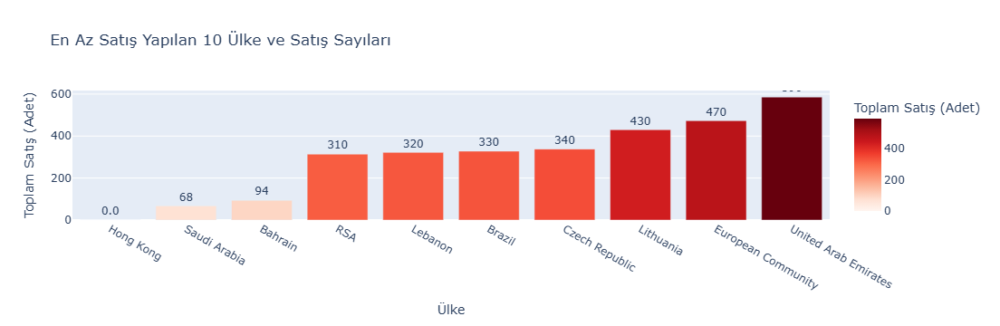

In [117]:
 
# 1. Ülke bazında toplam satış miktarını (Quantity) hesapla
least_countries = df_cleaned.groupby('Country')['Quantity'].sum().sort_values(ascending=True).head(10)

# 2. DataFrame'e dönüştür
least_countries_df = least_countries.reset_index()

# 3. Plotly ile çubuk grafiği oluştur
fig = px.bar(
    least_countries_df, 
    x='Country', 
    y='Quantity', 
    title='En Az Satış Yapılan 10 Ülke ve Satış Sayıları', 
    labels={'Quantity': 'Toplam Satış (Adet)', 'Country': 'Ülke'}, 
    color='Quantity',  # Renk toplam satışa göre belirlensin
    color_continuous_scale='Reds',  # Kırmızı tonlarında renk skalası
    text='Quantity'  # Çubukların üzerinde toplam satış miktarını göster
)

# 4. Grafik düzenlemeleri
fig.update_traces(
    texttemplate='%{text:.2s}',  # Satış sayılarını kısalt (örn. 1.2K)
    textposition='outside'  # Metni çubukların üstüne koy
)

# 5. Grafik göster
fig.show()


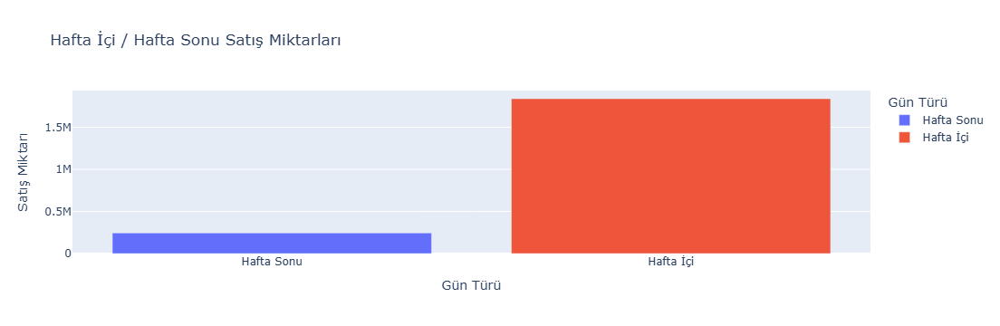

In [119]:
# Tarih tipine dönüştür
df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'])

# Hangi gün yapıldığına dair bilgi ekle (0: Pazartesi, 6: Pazar)
df_cleaned['DayOfWeek'] = df_cleaned['InvoiceDate'].dt.dayofweek

# Hafta içi (0-4) ve hafta sonu (5-6) kontrolü
df_cleaned['DayType'] = df_cleaned['DayOfWeek'].apply(lambda x: 'Hafta İçi' if x < 5 else 'Hafta Sonu')

# Satış miktarına göre grupla
day_type_sales = df_cleaned.groupby('DayType')['Quantity'].sum().reset_index()

# Görselleştirme (Plotly Bar Chart)
fig = px.bar(
    day_type_sales, 
    x='DayType', 
    y='Quantity', 
    title='Hafta İçi / Hafta Sonu Satış Miktarları', 
    labels={'Quantity': 'Satış Miktarı', 'DayType': 'Gün Türü'}, 
    color='DayType'
)
fig.show()


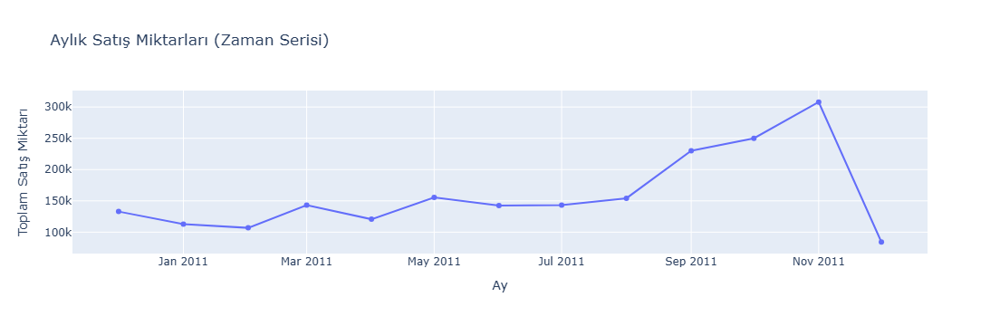

In [121]:
 
# Tarih tipine dönüştür
df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'])

# Aylık toplam satışları hesapla
df_cleaned['Month'] = df_cleaned['InvoiceDate'].dt.to_period('M')
monthly_sales = df_cleaned.groupby('Month')['Quantity'].sum().reset_index()

# Dönem bilgisini datetime formatına çevirelim (grafik için)
monthly_sales['Month'] = monthly_sales['Month'].astype(str)

# Görselleştirme (Zaman Serisi Çizgi Grafiği)
fig = px.line(
    monthly_sales, 
    x='Month', 
    y='Quantity', 
    title='Aylık Satış Miktarları (Zaman Serisi)', 
    labels={'Quantity': 'Toplam Satış Miktarı', 'Month': 'Ay'}, 
    markers=True
)
fig.show()


In [193]:


#  Kullanıcı-ürün etkileşim matrisi oluştur
interaction_matrix = df.pivot_table(index='CustomerID', columns='StockCode', values='Quantity', aggfunc='sum').fillna(0)

#  FunkSVD modeli oluştur
n_components = 20  # Gizli faktör sayısı
svd = TruncatedSVD(n_components=n_components, random_state=42)
user_matrix = svd.fit_transform(interaction_matrix)
item_matrix = svd.components_

#  Kullanıcı-ürün etkileşim tahminleri
predicted_ratings = np.dot(user_matrix, item_matrix)

#  Kullanıcı için ürün önerisi yap
user_id = 17850  # Örnek kullanıcı
user_idx = interaction_matrix.index.get_loc(user_id)

# Kullanıcının daha önce almadığı ürünleri al
user_ratings = interaction_matrix.iloc[user_idx, :]
user_predictions = predicted_ratings[user_idx, :]

# Ürünleri sıralayarak en iyi önerileri al
unseen_items = user_ratings[user_ratings == 0].index
predicted_scores = {item: user_predictions[interaction_matrix.columns.get_loc(item)] for item in unseen_items}
top_recommendations = sorted(predicted_scores.items(), key=lambda x: x[1], reverse=True)[:10]

#  Ürün isimlerini al (StockCode ile Description eşleştirme)
# Eşleştirme tablosu oluşturma
product_names = df[['StockCode', 'Description']].drop_duplicates(subset='StockCode')

# Önerilen ürünlerin isimlerini al
recommendation_df = pd.DataFrame(top_recommendations, columns=['StockCode', 'Score'])
recommendation_with_names = pd.merge(recommendation_df, product_names, on='StockCode', how='left')

#  Önerilen ürünleri listele
print("🛒 Kullanıcı {} için önerilen ürünler:".format(user_id))
for idx, row in recommendation_with_names.iterrows():
    print(f"Ürün Kodu: {row['StockCode']}, Ürün İsmi: {row['Description']}, Tahmini Skor: {row['Score']}")


🛒 Kullanıcı 17850 için önerilen ürünler:
Ürün Kodu: 22197, Ürün İsmi: SMALL POPCORN HOLDER, Tahmini Skor: 25.654790830972193
Ürün Kodu: 84879, Ürün İsmi: ASSORTED COLOUR BIRD ORNAMENT, Tahmini Skor: 25.482389255149375
Ürün Kodu: 22469, Ürün İsmi: HEART OF WICKER SMALL, Tahmini Skor: 18.666816984494663
Ürün Kodu: 22112, Ürün İsmi: CHOCOLATE HOT WATER BOTTLE, Tahmini Skor: 16.102041392865413
Ürün Kodu: 22629, Ürün İsmi: SPACEBOY LUNCH BOX , Tahmini Skor: 15.66719769589141
Ürün Kodu: 47566, Ürün İsmi: PARTY BUNTING, Tahmini Skor: 15.50329591744772
Ürün Kodu: 22151, Ürün İsmi: PLACE SETTING WHITE HEART, Tahmini Skor: 15.29351881264913
Ürün Kodu: 23355, Ürün İsmi: HOT WATER BOTTLE KEEP CALM, Tahmini Skor: 14.373819468385053
Ürün Kodu: 22630, Ürün İsmi: DOLLY GIRL LUNCH BOX, Tahmini Skor: 13.766020452270277
Ürün Kodu: 85099B, Ürün İsmi: JUMBO BAG RED RETROSPOT, Tahmini Skor: 13.639324820585847


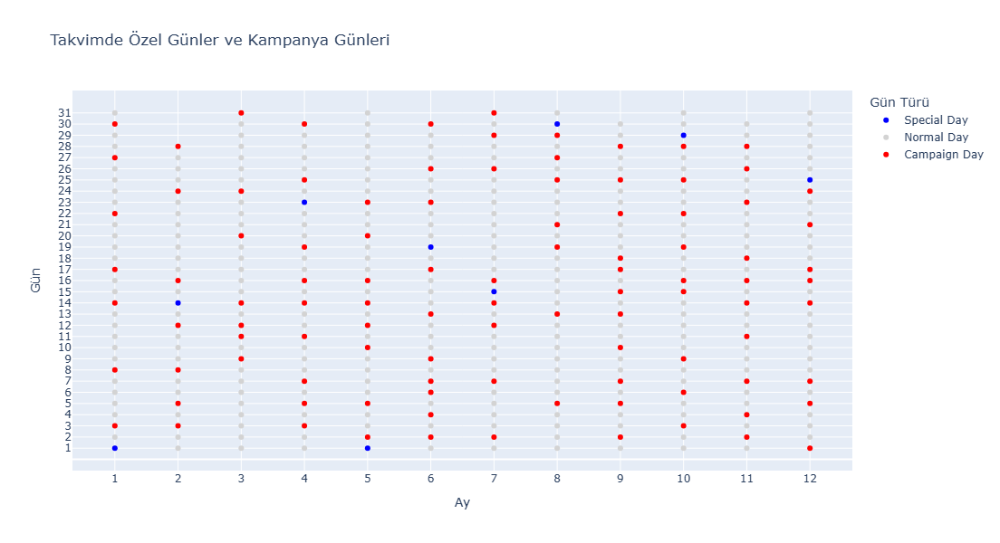

In [258]:

 
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])  # Tarih dönüşümü
data['Date'] = data['InvoiceDate'].dt.date  # Sadece tarih bilgisini al

# special_day ve campaign_day sütunlarındaki eksik verileri dolduralım mwvcut olan data setindeki 
data['special_day'] = data['special_day'].fillna(0).astype(int)  # NaN değerleri 0 yap ve tamsayıya çevir
data['campaign_day'] = data['campaign_day'].fillna(0).astype(int)  # NaN değerleri 0 yap ve tamsayıya çevir

# Özel günler ve kampanya günleri olan tüm tarihleri belirliyoruz
special_days = data[data['special_day'] == 1]['Date'].unique()  # Özel günler
campaign_days = data[data['campaign_day'] == 1]['Date'].unique()  # Kampanya günleri

# Bu tarihleri bir DataFrame olarak düzenleyelim tüm gğnlerin türlerini belirledik 
all_days = pd.DataFrame({'Date': data['Date'].unique()})
all_days['Date'] = pd.to_datetime(all_days['Date']).dt.date  # DateTime'ı sadece tarih formatına çevir
all_days['special_day'] = all_days['Date'].isin(special_days).astype(int)  # Özel gün kontrolü
all_days['campaign_day'] = all_days['Date'].isin(campaign_days).astype(int)  # Kampanya günü kontrolü

# Her günün türünü belirleyelim
all_days['day_type'] = all_days.apply(
    lambda row: 'Special Day' if row['special_day'] == 1 
                else 'Campaign Day' if row['campaign_day'] == 1 
                else 'Normal Day', 
    axis=1
)

# Takvim görünümü oluşturma ———
# Yıl, ay ve gün bilgilerini ekleyelim
all_days['Year'] = pd.to_datetime(all_days['Date']).dt.year
all_days['Month'] = pd.to_datetime(all_days['Date']).dt.month
all_days['Day'] = pd.to_datetime(all_days['Date']).dt.day

# Renk kodları: Özel günler ve kampanya günleri için renk atayalım
color_map = {'Special Day': 'blue', 'Campaign Day': 'red', 'Normal Day': 'lightgrey'}

# Takvimde, her günün özelliğine göre renklendirme yapacağız
fig = px.scatter(
    all_days, 
    x='Month', 
    y='Day', 
    color='day_type', 
    color_discrete_map=color_map, 
    hover_data={'Date': True, 'day_type': True},  # Fareyle üzerine gelindiğinde bilgi görünsün
    title='Takvimde Özel Günler ve Kampanya Günleri',
    labels={'day_type': 'Gün Türü', 'Month': 'Ay', 'Day': 'Gün'},
    category_orders={'Month': list(range(1, 13))}  # Ay sırası 1'den 12'ye olacak
)

# Ekseni duzgun gostermek icin layout ayarlamasi
fig.update_layout(
    xaxis_title='Ay',
    yaxis_title='Gün',
    yaxis=dict(tickvals=list(range(1, 32))),  # 1-31 aralığındaki günleri göster
    xaxis=dict(tickvals=list(range(1, 13))),  # 1-12 aralığındaki ayları göster
    height=600,  # Grafik yüksekliği
    width=900   # Grafik genişliği
)

# Grafiği göster
fig.show()


In [201]:
# Tarih bilgilerini çıkar
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['Day'] = df['InvoiceDate'].dt.day
df['Month'] = df['InvoiceDate'].dt.month
df['Year'] = df['InvoiceDate'].dt.year
df['Weekday'] = df['InvoiceDate'].dt.weekday  # Pazartesi=0, Pazar=6
df['IsWeekend'] = df['Weekday'].apply(lambda x: 1 if x >= 5 else 0)
df['TotalPrice'] = df['Quantity'] * df['UnitPrice']

# Mevsim bilgisi ekleyelim
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['Season'] = df['Month'].apply(get_season)


In [210]:
# Etiketleme işlemi (Season)
le = LabelEncoder()
df['Season'] = le.fit_transform(df['Season'])

# Model için bağımlı (Y) ve bağımsız (X) değişkenleri ayır
X = df[['Quantity', 'UnitPrice', 'Day', 'Month', 'Weekday', 'IsWeekend', 'Season']]
y = df['TotalPrice']

# Veriyi eğitim ve test setine ayır
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [211]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score 
# Random Forest Modeli
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Tahmin yap
y_pred_rf = rf_model.predict(X_test)

# Performans metriklerini yazdır
print('Random Forest Sonuçları:')
print('MSE:', mean_squared_error(y_test, y_pred_rf))
print('MAE:', mean_absolute_error(y_test, y_pred_rf))
print('R2 Skoru:', r2_score(y_test, y_pred_rf))


Random Forest Sonuçları:
MSE: 1.643372299783574
MAE: 0.023049506294010907
R2 Skoru: 0.9947761622914492


In [212]:
# XGBoost Modeli
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# Tahmin yap
y_pred_xgb = xgb_model.predict(X_test)

# Performans metriklerini yazdır
print('XGBoost Sonuçları:')
print('MSE:', mean_squared_error(y_test, y_pred_xgb))
print('MAE:', mean_absolute_error(y_test, y_pred_xgb))
print('R2 Skoru:', r2_score(y_test, y_pred_xgb))

#MSE'nin düşük olması, modelin hata yapma oranının düşük olduğunu gösterir
# R modelin veriye ne kadar iyi uyduğunu gösteren bir metriktir.   %88.3'ünü açıklıyor. Bu oldukça iyi bir sonuçtur.
#MAE Daha küçük bir değer, daha iyi bir tahmin anlamına gelir.

XGBoost Sonuçları:
MSE: 36.68296216702997
MAE: 0.4166872612637504
R2 Skoru: 0.8833947480709572


In [235]:

y_pred_rf = np.array(y_pred_rf)
y_pred_xgb = np.array(y_pred_xgb)
final_predictions = (y_pred_rf + y_pred_xgb) / 2
print(final_predictions)
#Random forest ve 

[ 5.77027431 14.96386843 14.97828321 ... 20.80582848 17.67910061
 25.19263515]


In [242]:
 

mse = mean_squared_error(y_test, final_predictions)
mae = mean_absolute_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

print('Ortalama Tahmin Sonuçları:')
print('MSE:', mse)
print('MAE:', mae)
print('R2 Skoru:', r2)
# MSE	9.47  Evet	Hata karelerinin ortalaması 9.47. Küçük olması iyi olur mse için 
# MAE	0.21 Harika	Ortalama sapma sadece 0.21 birim. Çok iyi bir değer 
# R2 Skoru	0.9698 Mükemmel	%96.98 açıklama gücü. Model oldukça güçlü. 0 1 aralıgında 1 e çok yakın oldugu için 

Ortalama Tahmin Sonuçları:
MSE: 9.476441417143556
MAE: 0.2106618833862042
R2 Skoru: 0.9698769463107862


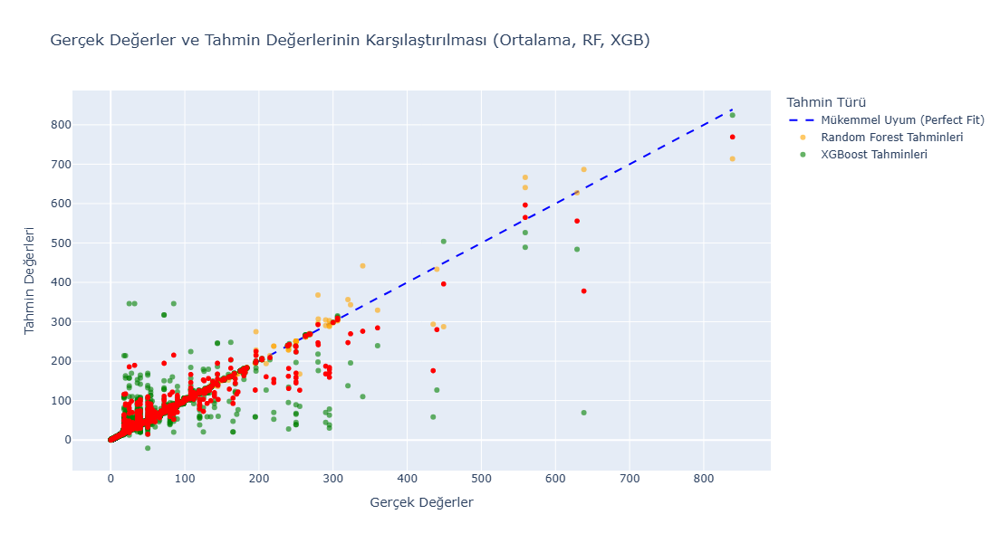

In [244]:


# Gerçek test verileri ve her iki modelin tahmin değerleri
results_df = pd.DataFrame({
    'Gerçek Değerler': y_test, 
    'Random Forest Tahminleri': y_pred_rf, 
    'XGBoost Tahminleri': y_pred_xgb, 
    'Ortalama Tahminler': (y_pred_rf + y_pred_xgb) / 2  # Ortalama tahmin
})

#  Scatter plot: Gerçek ve ortalama tahmin değerleri karşılaştırması
fig = px.scatter(
    results_df, 
    x='Gerçek Değerler', 
    y='Ortalama Tahminler', 
    title='Gerçek ve Ortalama Tahmin Değerlerinin Karşılaştırılması', 
    labels={'Gerçek Değerler': 'Gerçek Değerler', 'Ortalama Tahminler': 'Ortalama Tahmin Değerleri'},
    color_discrete_sequence=['red']
)

# Kusursuz tahmin çizgisi (Perfect Fit) — Gerçek değerlerle tahmin değerleri arasında 1:1 ilişki
fig.add_trace(
    go.Scatter(
        x=[results_df['Gerçek Değerler'].min(), results_df['Gerçek Değerler'].max()],
        y=[results_df['Gerçek Değerler'].min(), results_df['Gerçek Değerler'].max()],
        mode='lines',
        name='Mükemmel Uyum (Perfect Fit)',
        line=dict(color='blue', dash='dash')
    )
)

#  Ek olarak, RandomForest ve XGBoost tahminlerini de görebiliriz
fig.add_trace(
    go.Scatter(
        x=results_df['Gerçek Değerler'], 
        y=results_df['Random Forest Tahminleri'], 
        mode='markers', 
        name='Random Forest Tahminleri',
        marker=dict(color='orange', size=6, opacity=0.6)
    )
)

fig.add_trace(
    go.Scatter(
        x=results_df['Gerçek Değerler'], 
        y=results_df['XGBoost Tahminleri'], 
        mode='markers', 
        name='XGBoost Tahminleri',
        marker=dict(color='green', size=6, opacity=0.6)
    )
)

#  Grafiğin son ayarları ve gösterimi
fig.update_layout(
    xaxis_title="Gerçek Değerler",
    yaxis_title="Tahmin Değerleri",
    title="Gerçek Değerler ve Tahmin Değerlerinin Karşılaştırılması (Ortalama, RF, XGB)",
    legend_title="Tahmin Türü",
    width=900,
    height=600
)

# Grafiği göster
fig.show()


import plotly.express as px
import plotly.graph_objects as go

# Gerçek ve tahmin değerlerini bir DataFrame'e koy
results_df = pd.DataFrame({'Gerçek Değerler': y_test, 
                           'Random Forest Tahmini': y_pred_rf, 
                           'XGBoost Tahmini': y_pred_xgb})

# Mükemmel tahmin çizgisini ekle
perfect_fit_line = go.Scatter(
    x=[results_df['Gerçek Değerler'].min(), results_df['Gerçek Değerler'].max()],
    y=[results_df['Gerçek Değerler'].min(), results_df['Gerçek Değerler'].max()],
    mode='lines',
    name='Perfect Fit',
    line=dict(color='black', dash='dash')
)

# Random Forest için scatter plot
rf_scatter = go.Scatter(
    x=results_df['Gerçek Değerler'], 
    y=results_df['Random Forest Tahmini'], 
    mode='markers',
    name='Random Forest',
    marker=dict(color='red', opacity=0.6)
)

# XGBoost için scatter plot
xgb_scatter = go.Scatter(
    x=results_df['Gerçek Değerler'], 
    y=results_df['XGBoost Tahmini'], 
    mode='markers',
    name='XGBoost',
    marker=dict(color='blue', opacity=0.6)
)

# Tüm izleri birleştirme
fig = go.Figure(data=[rf_scatter, xgb_scatter, perfect_fit_line])

# Grafik düzeni
fig.update_layout(
    title="Gerçek ve Tahmin Değerlerinin Karşılaştırılması",
    xaxis_title="Gerçek Değerler",
    yaxis_title="Tahmin Değerleri",
    legend_title="Model",
    width=800,
    height=600
)

# Grafiği göster
fig.show()
